# Hyperspectral Benchmark Dataset Exploration

Visual exploration of the 4 PRISMA L2D hyperspectral benchmark scenes.
Each scene has 239 bands (173 SWIR + 66 VNIR), covering ~453–2497 nm.
Ground truth anomaly labels are overlaid on RGB composites and analyzed
spectrally to understand what makes anomalies detectable.

### 1. Load all 4 benchmark scenes via PrismaDatasetBuilder

In [1]:
import os
import sys
import pathlib
import numpy as np
import rasterio
import matplotlib.pyplot as plt

PROJECT_ROOT = str(pathlib.Path(os.getcwd()).parents[1])
if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

from app.models.file_processing.sources import FileSourceConfig
from app.utils.dataset_builder.prisma_dataset_builder import PrismaDatasetBuilder
from app.models.dataset.vendables import BandFilterConfig, DEFAULT_COMMON_WAVELENGTH_GRID

BENCHMARK_ROOT = os.path.join(PROJECT_ROOT, "benchmarking", "hyperspectral")
DATASET_IDS = [1, 2, 3, 4]

band_filter_config = BandFilterConfig(common_wavelength_grid=DEFAULT_COMMON_WAVELENGTH_GRID)

datasets = {}
for did in DATASET_IDS:
    folder = os.path.join(BENCHMARK_ROOT, str(did))
    he5_files = [f for f in os.listdir(folder) if f.endswith(".he5")]
    assert len(he5_files) == 1, f"Expected 1 HE5 in {folder}, found {he5_files}"
    he5_path = os.path.join(folder, he5_files[0])
    gt_path = os.path.join(folder, "gt.tif")

    print(f"=== Loading Dataset {did}: {he5_files[0][:50]}... ===")

    builder = PrismaDatasetBuilder(
        file_source_configuration=FileSourceConfig(source_path=he5_path)
    )
    vendable = builder.vend_dataset(band_filter_config=band_filter_config)

    with rasterio.open(gt_path) as src:
        gt_data = src.read(1)

    cube = vendable.normalized_hyperspectral_cube        # (C, H, W)
    validity = vendable.validity_cube                     # (C, H, W)
    wavelengths = vendable.band_cw_order                  # list of floats
    families = vendable.spectral_family_order              # list of SpectralFamily
    band_validity = vendable.band_validity_by_position     # list of 0/1
    band_scores = vendable.band_level_validity_score       # list of floats

    # After pipeline filtering, pixels are either fully valid or fully invalid.
    spatial_validity = (validity.sum(axis=0) > 0).astype(np.uint8)  # (H, W)

    datasets[did] = {
        "name": he5_files[0].replace(".he5", ""),
        "vendable": vendable,
        "cube": cube,                                     # (C, H, W)
        "validity": validity,                             # (C, H, W)
        "spatial_validity": spatial_validity,              # (H, W)
        "wavelengths": np.array(wavelengths),             # (C,)
        "families": families,
        "band_validity": np.array(band_validity),
        "band_scores": np.array(band_scores),
        "gt": (gt_data > 0).astype(np.uint8),             # (H, W)
    }

    C, H, W = cube.shape
    n_anom = datasets[did]["gt"].sum()
    valid_frac = spatial_validity.sum() / (H * W) * 100
    print(f"  Cube shape: {cube.shape} ({C} bands, {H}x{W} pixels)")
    print(f"  Valid bands: {C}")
    print(f"  Wavelength range: [{min(wavelengths):.1f}, {max(wavelengths):.1f}] nm")
    print(f"  Spatial validity: {valid_frac:.1f}%")
    print(f"  Anomaly pixels: {n_anom:,}")
    print()

=== Loading Dataset 1: PRS_L2D_STD_20201214060713_20201214060717_0001.he5... ===
Using device: mps
Using device: mps
  Cube shape: (165, 1186, 1196) (165 bands, 1186x1196 pixels)
  Valid bands: 165
  Wavelength range: [460.0, 2450.0] nm
  Spatial validity: 70.0%
  Anomaly pixels: 638

=== Loading Dataset 2: PRS_L2D_STD_20241205050514_20241205050518_0001.he5... ===
Using device: mps
Using device: mps
  Cube shape: (165, 1216, 1280) (165 bands, 1216x1280 pixels)
  Valid bands: 165
  Wavelength range: [460.0, 2450.0] nm
  Spatial validity: 67.5%
  Anomaly pixels: 992

=== Loading Dataset 3: PRS_L2D_STD_20210516050459_20210516050503_0001.he5... ===
Using device: mps
Using device: mps
  Cube shape: (165, 1202, 1210) (165 bands, 1202x1210 pixels)
  Valid bands: 165
  Wavelength range: [460.0, 2450.0] nm
  Spatial validity: 68.4%
  Anomaly pixels: 778

=== Loading Dataset 4: PRS_L2D_STD_20231229050902_20231229050907_0001.he5... ===
Using device: mps
Using device: mps
  Cube shape: (165, 1210,

### 2. RGB Composites (2x2)

False-color RGB composites using bands nearest to R=650nm, G=550nm, B=450nm.
Percentile stretch (2nd-98th) for display.

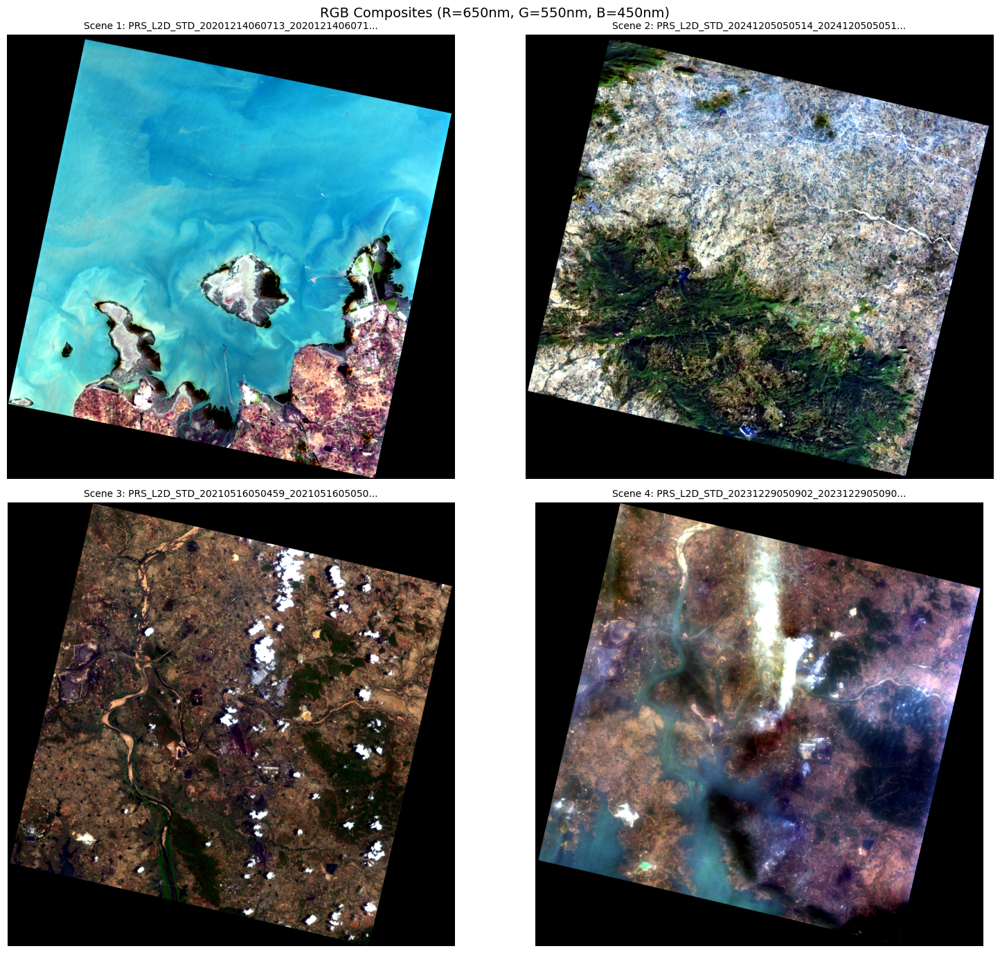

In [2]:
def make_rgb_composite(cube, wavelengths, validity, r_nm=650, g_nm=550, b_nm=450):
    """Create an RGB composite from the nearest bands to target wavelengths."""
    r_idx = np.argmin(np.abs(wavelengths - r_nm))
    g_idx = np.argmin(np.abs(wavelengths - g_nm))
    b_idx = np.argmin(np.abs(wavelengths - b_nm))

    rgb = np.stack([cube[r_idx], cube[g_idx], cube[b_idx]], axis=-1)  # (H, W, 3)

    # Percentile stretch per channel
    for ch in range(3):
        valid_vals = rgb[:, :, ch][validity > 0]
        if len(valid_vals) > 0:
            p2, p98 = np.percentile(valid_vals, [2, 98])
            rgb[:, :, ch] = np.clip((rgb[:, :, ch] - p2) / (p98 - p2 + 1e-10), 0, 1)

    # Mask invalid pixels as black
    rgb[validity == 0] = 0
    return rgb

fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.ravel()

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    rgb = make_rgb_composite(d["cube"], d["wavelengths"], d["spatial_validity"])

    axes[idx].imshow(rgb)
    axes[idx].set_title(f"Scene {did}: {d['name'][:40]}...", fontsize=10)
    axes[idx].axis("off")

plt.suptitle("RGB Composites (R=650nm, G=550nm, B=450nm)", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

### 3. Anomaly Overlay on RGB Composites (2x2)

Ground truth anomaly pixels overlaid as cyan dots on the RGB composite.

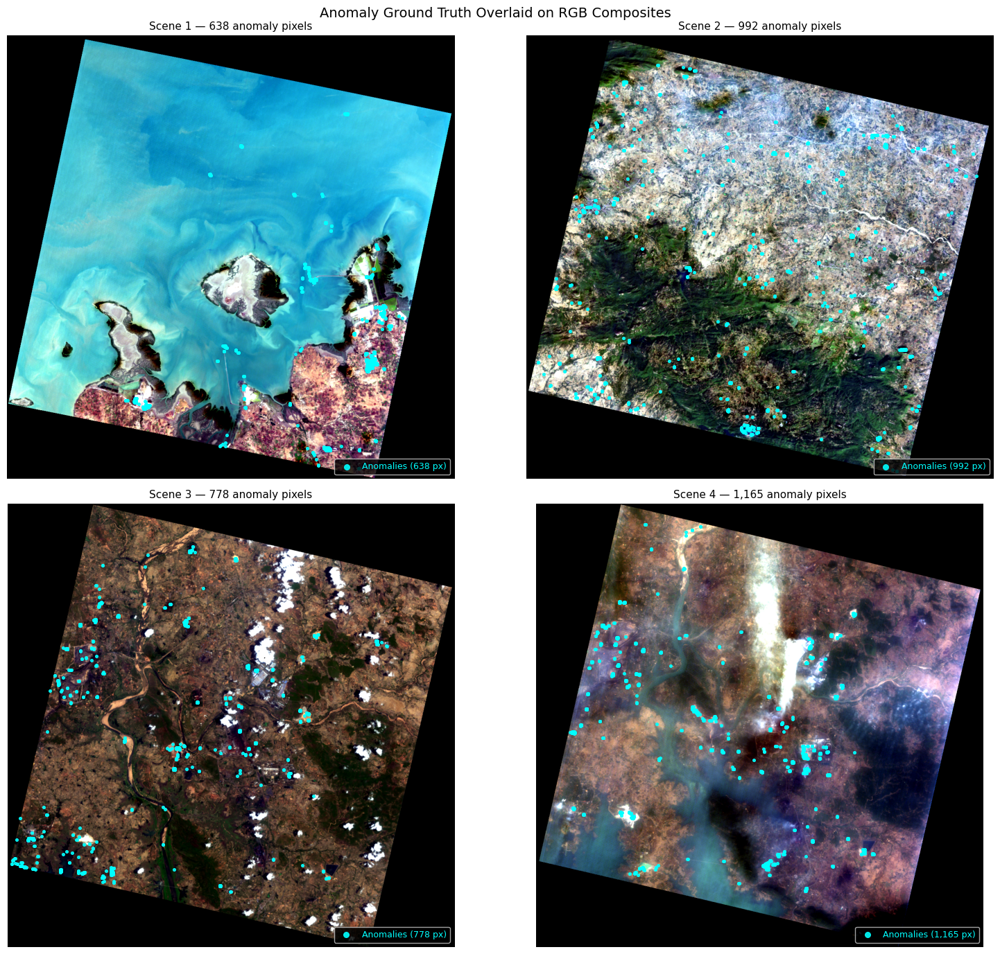

In [11]:
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.ravel()

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    rgb = make_rgb_composite(d["cube"], d["wavelengths"], d["spatial_validity"])

    axes[idx].imshow(rgb)

    anom_rows, anom_cols = np.where(d["gt"] > 0)
    axes[idx].scatter(
        anom_cols, anom_rows,
        c="cyan", s=8, marker="o", linewidths=0.8, edgecolors="cyan", alpha=0.9,
        label=f"Anomalies ({len(anom_rows):,} px)",
    )

    axes[idx].set_title(f"Scene {did} — {len(anom_rows):,} anomaly pixels", fontsize=11)
    axes[idx].axis("off")
    axes[idx].legend(loc="lower right", fontsize=9, markerscale=2,
                     framealpha=0.8, facecolor="black", labelcolor="cyan")

plt.suptitle("Anomaly Ground Truth Overlaid on RGB Composites", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

### 4. Zoomed Anomaly Regions (2x2)

Zoomed view of the anomaly bounding box with 200px padding.

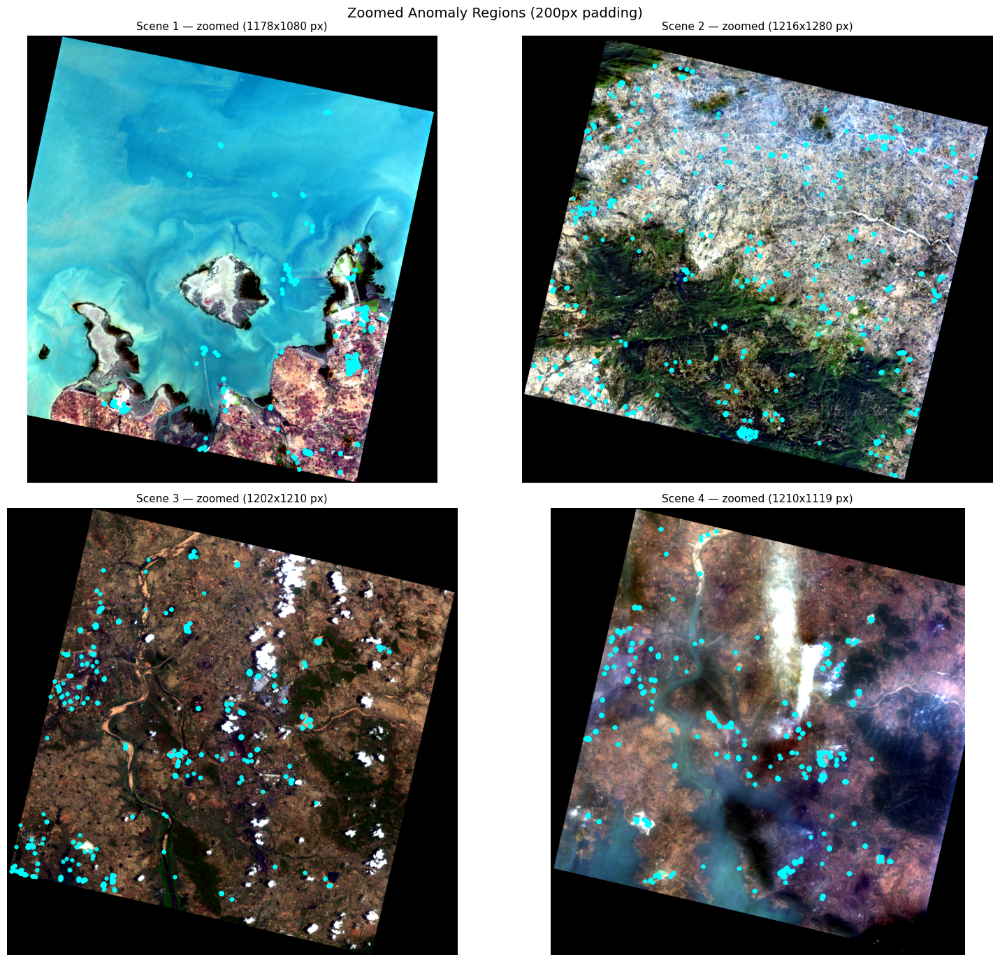

In [12]:
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.ravel()

PAD = 200

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    gt = d["gt"]
    H, W = gt.shape

    anom_rows, anom_cols = np.where(gt > 0)
    if len(anom_rows) == 0:
        axes[idx].set_title(f"Scene {did} — no anomalies")
        continue

    r_min = max(0, anom_rows.min() - PAD)
    r_max = min(H, anom_rows.max() + PAD)
    c_min = max(0, anom_cols.min() - PAD)
    c_max = min(W, anom_cols.max() + PAD)

    crop_cube = d["cube"][:, r_min:r_max, c_min:c_max]
    crop_valid = d["spatial_validity"][r_min:r_max, c_min:c_max]
    crop_gt = gt[r_min:r_max, c_min:c_max]

    rgb = make_rgb_composite(crop_cube, d["wavelengths"], crop_valid)
    axes[idx].imshow(rgb)

    ar, ac = np.where(crop_gt > 0)
    axes[idx].scatter(ac, ar, c="cyan", s=12, marker="o",
                      linewidths=1.0, edgecolors="cyan", alpha=0.9)

    axes[idx].set_title(
        f"Scene {did} — zoomed ({r_max-r_min}x{c_max-c_min} px)", fontsize=11
    )
    axes[idx].axis("off")

plt.suptitle("Zoomed Anomaly Regions (200px padding)", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

### 5. Band Validity & Wavelength Coverage

Per-band valid pixel percentage and wavelength distribution.
Bands with low validity scores may need to be excluded from analysis.

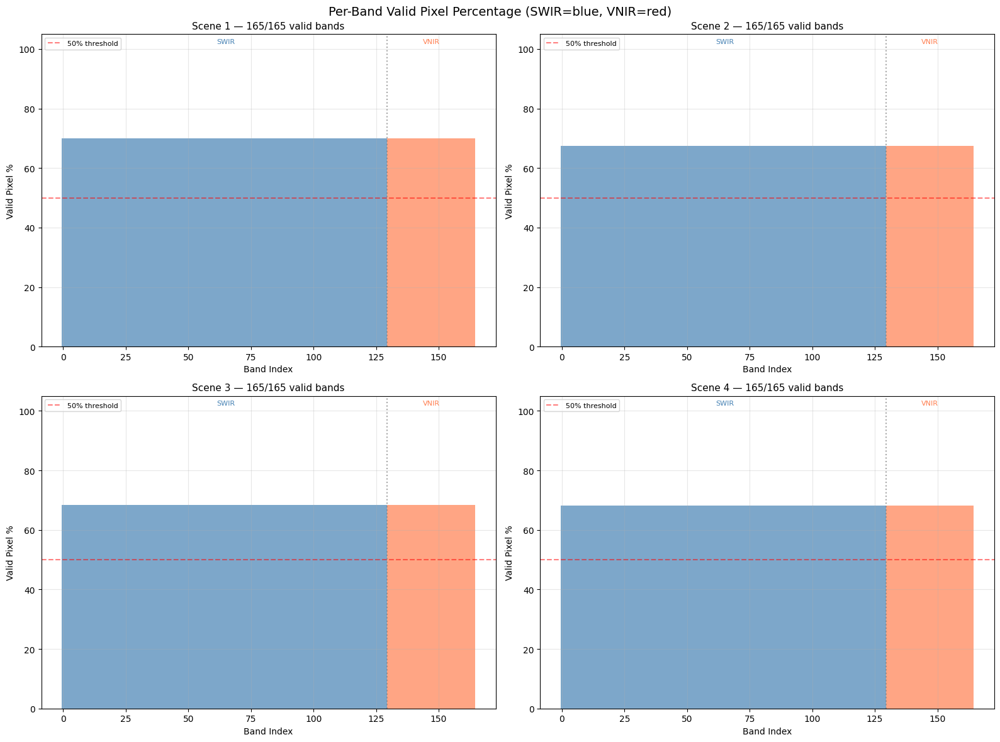

In [13]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    wl = d["wavelengths"]
    scores = d["band_scores"]
    bv = d["band_validity"]

    # Color by spectral family
    colors = ["steelblue" if str(f) == "SpectralFamily.SWIR" else "coral"
              for f in d["families"]]

    axes[idx].bar(range(len(wl)), scores, color=colors, alpha=0.7, width=1.0)
    axes[idx].set_xlabel("Band Index")
    axes[idx].set_ylabel("Valid Pixel %")
    axes[idx].set_title(f"Scene {did} — {sum(bv)}/{len(bv)} valid bands", fontsize=11)
    axes[idx].set_ylim([0, 105])
    axes[idx].axhline(50, color="red", linestyle="--", alpha=0.5, label="50% threshold")
    axes[idx].legend(fontsize=8)
    axes[idx].grid(True, alpha=0.3)

    # Add SWIR/VNIR labels
    n_swir = sum(1 for f in d["families"] if "SWIR" in str(f))
    axes[idx].axvline(n_swir - 0.5, color="gray", linestyle=":", alpha=0.7)
    axes[idx].text(n_swir // 2, 102, "SWIR", ha="center", fontsize=8, color="steelblue")
    axes[idx].text(n_swir + (len(wl) - n_swir) // 2, 102, "VNIR", ha="center", fontsize=8, color="coral")

plt.suptitle("Per-Band Valid Pixel Percentage (SWIR=blue, VNIR=red)", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

### 6. Spectral Profiles: Anomaly vs Background

Mean spectral signatures of anomaly pixels vs normal background pixels.
Spectral separation between anomalies and background is what makes
hyperspectral anomaly detection possible.

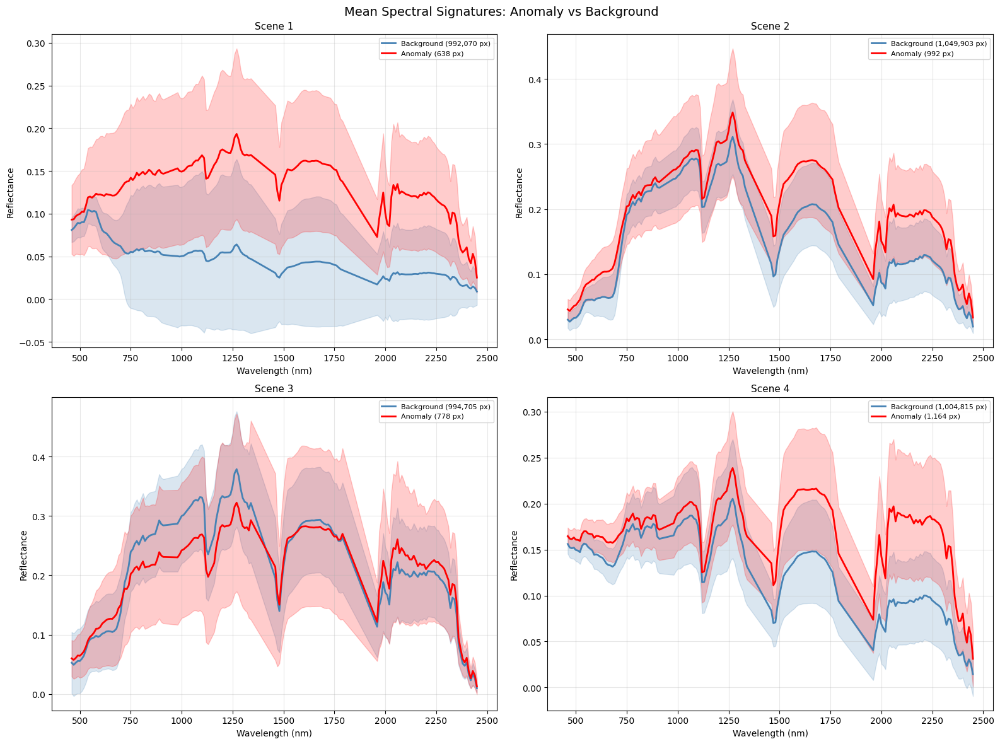

In [14]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    cube = d["cube"]         # (C, H, W)
    gt = d["gt"]             # (H, W)
    sv = d["spatial_validity"]  # (H, W)
    wl = d["wavelengths"]
    bv = d["band_validity"]

    # Only use valid bands
    valid_band_mask = bv == 1

    # Extract spectra for valid pixels
    normal_mask = (gt == 0) & (sv == 1)
    anomaly_mask = (gt > 0) & (sv == 1)

    n_normal = normal_mask.sum()
    n_anomaly = anomaly_mask.sum()

    if n_anomaly == 0 or n_normal == 0:
        axes[idx].set_title(f"Scene {did} — insufficient pixels")
        continue

    # Mean spectra (subsample normals for speed)
    normal_spectra = cube[:, normal_mask]  # (C, N_normal)
    anomaly_spectra = cube[:, anomaly_mask]  # (C, N_anomaly)

    # Subsample normals to max 50000 for speed
    if normal_spectra.shape[1] > 50000:
        rng = np.random.default_rng(42)
        idx_sub = rng.choice(normal_spectra.shape[1], 50000, replace=False)
        normal_spectra = normal_spectra[:, idx_sub]

    normal_mean = normal_spectra.mean(axis=1)
    normal_std = normal_spectra.std(axis=1)
    anomaly_mean = anomaly_spectra.mean(axis=1)
    anomaly_std = anomaly_spectra.std(axis=1)

    # Plot using wavelengths on x-axis
    axes[idx].fill_between(wl, normal_mean - normal_std, normal_mean + normal_std,
                           alpha=0.2, color="steelblue")
    axes[idx].plot(wl, normal_mean, color="steelblue", lw=2,
                   label=f"Background ({n_normal:,} px)")

    axes[idx].fill_between(wl, anomaly_mean - anomaly_std, anomaly_mean + anomaly_std,
                           alpha=0.2, color="red")
    axes[idx].plot(wl, anomaly_mean, color="red", lw=2,
                   label=f"Anomaly ({n_anomaly:,} px)")

    axes[idx].set_xlabel("Wavelength (nm)")
    axes[idx].set_ylabel("Reflectance")
    axes[idx].set_title(f"Scene {did}", fontsize=11)
    axes[idx].legend(fontsize=8)
    axes[idx].grid(True, alpha=0.3)

plt.suptitle("Mean Spectral Signatures: Anomaly vs Background", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

### 7. Spectral Difference (Anomaly - Background)

Bands where the difference is large are the most discriminative for detection.
Positive = anomaly brighter, Negative = anomaly darker.

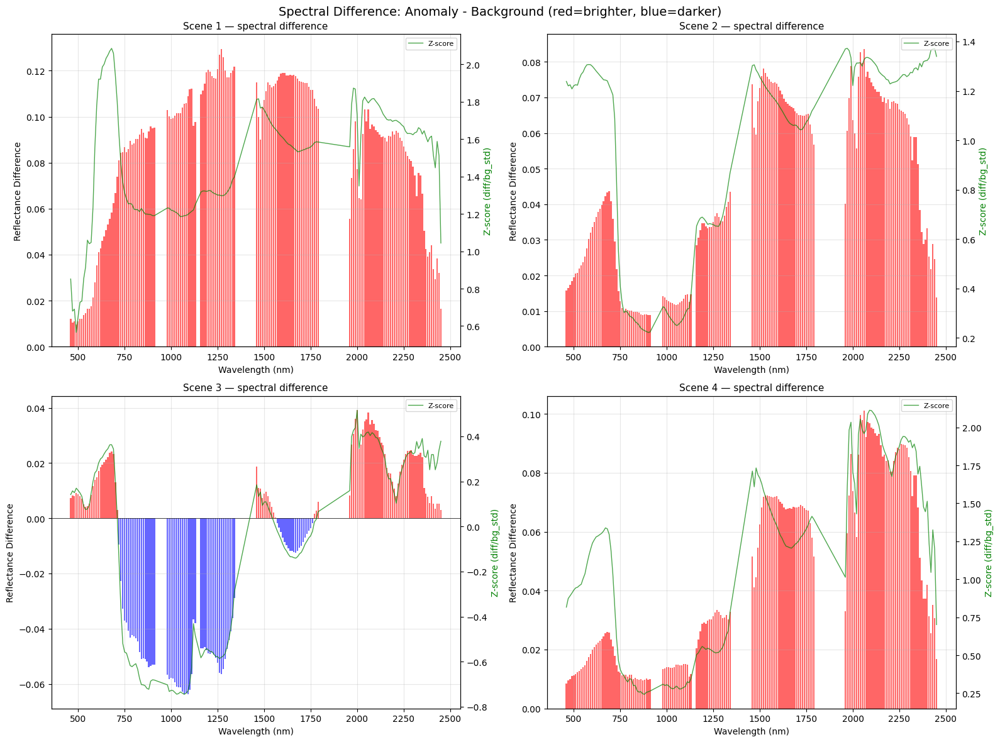

In [15]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    cube = d["cube"]
    gt = d["gt"]
    sv = d["spatial_validity"]
    wl = d["wavelengths"]
    bv = d["band_validity"]

    normal_mask = (gt == 0) & (sv == 1)
    anomaly_mask = (gt > 0) & (sv == 1)

    if anomaly_mask.sum() == 0 or normal_mask.sum() == 0:
        axes[idx].set_title(f"Scene {did} — insufficient pixels")
        continue

    normal_spectra = cube[:, normal_mask]
    anomaly_spectra = cube[:, anomaly_mask]

    if normal_spectra.shape[1] > 50000:
        rng = np.random.default_rng(42)
        idx_sub = rng.choice(normal_spectra.shape[1], 50000, replace=False)
        normal_spectra = normal_spectra[:, idx_sub]

    diff = anomaly_spectra.mean(axis=1) - normal_spectra.mean(axis=1)
    bg_std = normal_spectra.std(axis=1)
    z_diff = diff / (bg_std + 1e-10)

    # Color by sign
    colors = ["red" if d > 0 else "blue" for d in diff]

    axes[idx].bar(wl, diff, color=colors, alpha=0.6, width=8)
    axes[idx].axhline(0, color="black", lw=0.5)
    axes[idx].set_xlabel("Wavelength (nm)")
    axes[idx].set_ylabel("Reflectance Difference")
    axes[idx].set_title(f"Scene {did} — spectral difference", fontsize=11)
    axes[idx].grid(True, alpha=0.3)

    # Secondary axis: z-score
    ax2 = axes[idx].twinx()
    ax2.plot(wl, z_diff, color="green", lw=1, alpha=0.7, label="Z-score")
    ax2.set_ylabel("Z-score (diff/bg_std)", color="green")
    ax2.legend(fontsize=8, loc="upper right")

plt.suptitle("Spectral Difference: Anomaly - Background (red=brighter, blue=darker)", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

### 8. Band-by-Band Anomaly Visualization

Select the most discriminative bands (highest z-score difference) and
show the scene at those wavelengths. Anomalies should be visible.

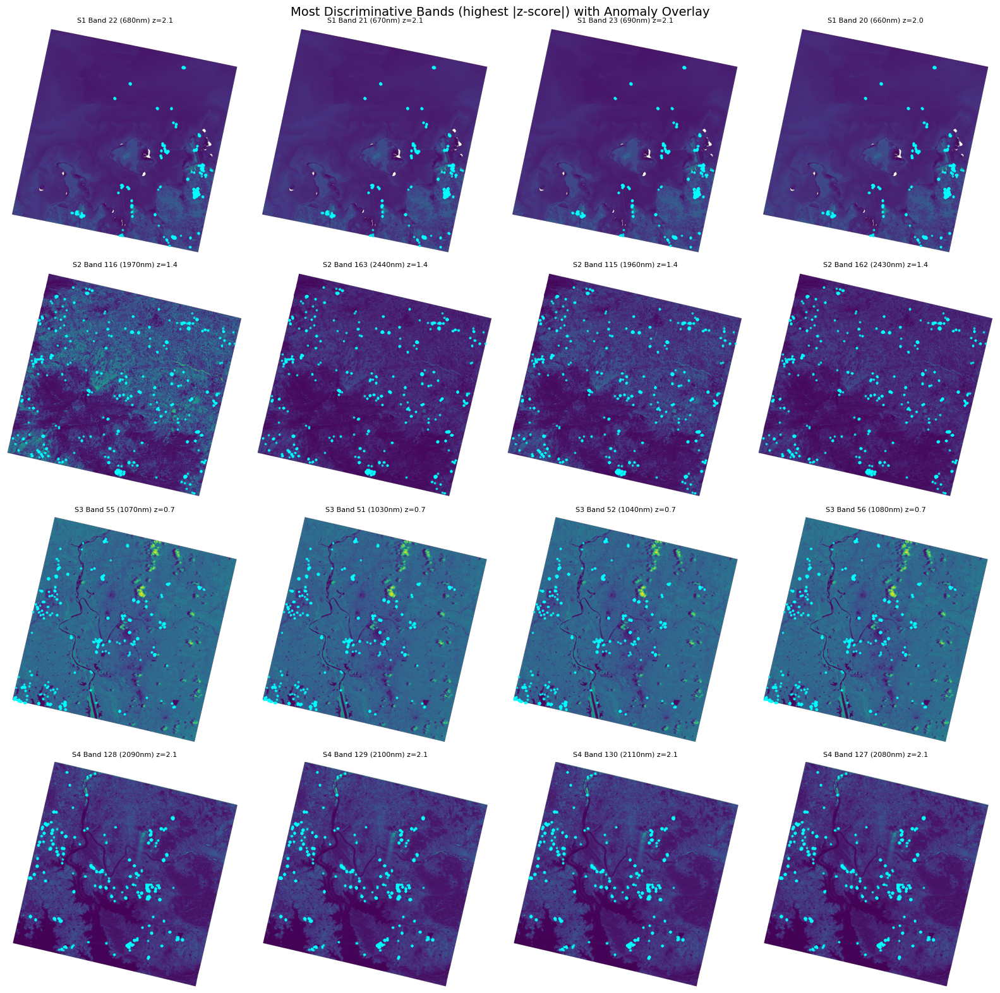

In [16]:
fig, axes = plt.subplots(4, 4, figsize=(16, 16))

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    cube = d["cube"]
    gt = d["gt"]
    sv = d["spatial_validity"]
    wl = d["wavelengths"]

    normal_mask = (gt == 0) & (sv == 1)
    anomaly_mask = (gt > 0) & (sv == 1)

    if anomaly_mask.sum() == 0:
        for j in range(4):
            axes[idx, j].set_title(f"Scene {did} — no anomalies")
        continue

    normal_spectra = cube[:, normal_mask]
    anomaly_spectra = cube[:, anomaly_mask]

    if normal_spectra.shape[1] > 50000:
        rng = np.random.default_rng(42)
        idx_sub = rng.choice(normal_spectra.shape[1], 50000, replace=False)
        normal_spectra = normal_spectra[:, idx_sub]

    diff = anomaly_spectra.mean(axis=1) - normal_spectra.mean(axis=1)
    bg_std = normal_spectra.std(axis=1)
    z_diff = np.abs(diff / (bg_std + 1e-10))

    # Top 4 most discriminative bands
    top_bands = np.argsort(z_diff)[-4:][::-1]

    for j, band_idx in enumerate(top_bands):
        band_img = cube[band_idx]
        display = np.ma.masked_where(sv == 0, band_img)

        im = axes[idx, j].imshow(display, cmap="viridis")
        anom_r, anom_c = np.where(gt > 0)
        axes[idx, j].scatter(anom_c, anom_r, c="cyan", s=3, alpha=0.7)
        axes[idx, j].set_title(f"S{did} Band {band_idx} ({wl[band_idx]:.0f}nm) z={z_diff[band_idx]:.1f}", fontsize=8)
        axes[idx, j].axis("off")

plt.suptitle("Most Discriminative Bands (highest |z-score|) with Anomaly Overlay", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

### 9. Anomaly Pixel Spatial Distribution

Density of anomaly pixels across the scene.

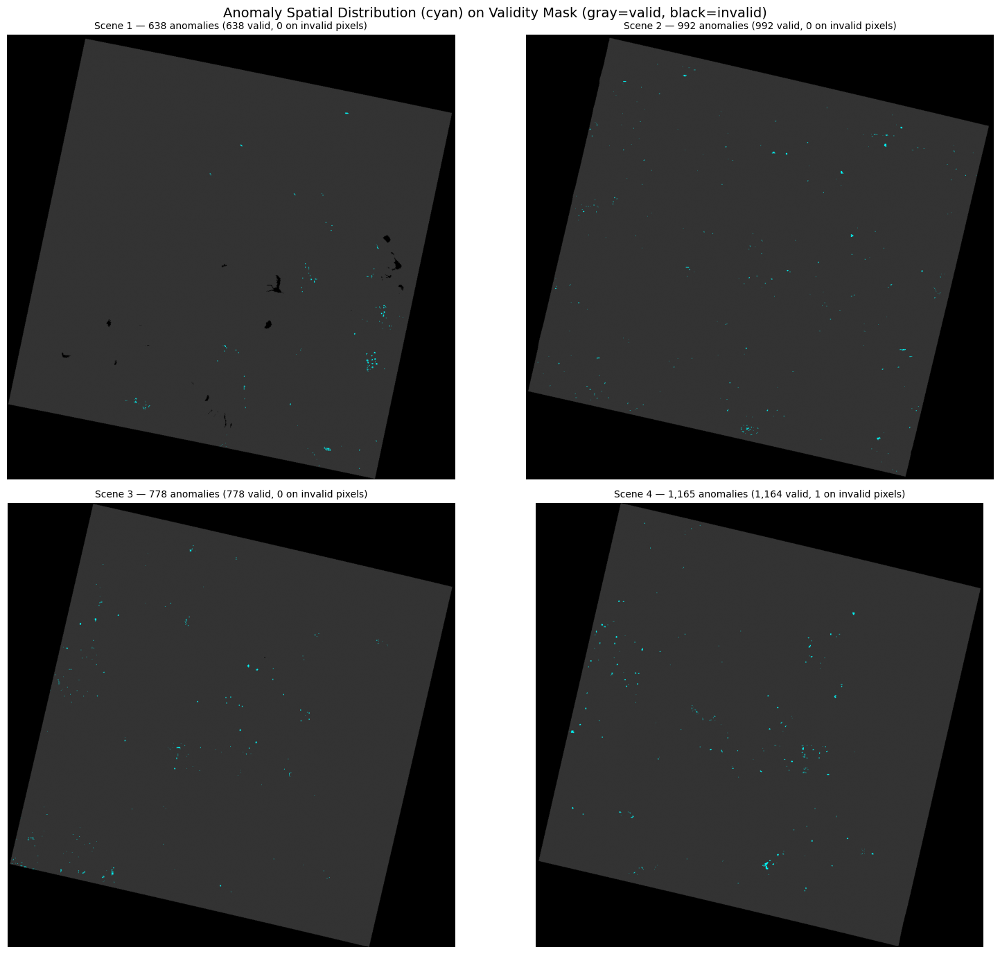

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
axes = axes.ravel()

for idx, did in enumerate(DATASET_IDS):
    d = datasets[did]
    gt = d["gt"]
    sv = d["spatial_validity"]
    H, W = gt.shape

    # Show validity mask with anomaly overlay
    display = np.zeros((H, W, 3))
    display[sv == 1] = [0.2, 0.2, 0.2]  # valid = dark gray
    display[sv == 0] = [0, 0, 0]         # invalid = black
    display[gt > 0] = [0, 1, 1]          # anomaly = cyan

    axes[idx].imshow(display)

    anom_rows, anom_cols = np.where(gt > 0)
    valid_anomalies = gt[sv == 1].sum()
    invalid_anomalies = gt[sv == 0].sum()

    axes[idx].set_title(
        f"Scene {did} — {gt.sum():,} anomalies "
        f"({valid_anomalies:,} valid, {invalid_anomalies:,} on invalid pixels)",
        fontsize=10
    )
    axes[idx].axis("off")

plt.suptitle("Anomaly Spatial Distribution (cyan) on Validity Mask (gray=valid, black=invalid)", fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

### 10. Summary Statistics Table

In [18]:
print(f"{'':=<110}")
print(f"{'HYPERSPECTRAL BENCHMARK DATASET SUMMARY':^110}")
print(f"{'':=<110}")

for did in DATASET_IDS:
    d = datasets[did]
    cube = d["cube"]
    gt = d["gt"]
    sv = d["spatial_validity"]
    wl = d["wavelengths"]
    bv = d["band_validity"]
    C, H, W = cube.shape

    n_valid_bands = bv.sum()
    valid_frac = sv.sum() / (H * W) * 100
    n_anom = gt.sum()
    n_anom_valid = gt[sv == 1].sum()
    n_anom_invalid = gt[sv == 0].sum()

    anom_rows, anom_cols = np.where(gt > 0)

    print(f"\n--- Dataset {did}: {d['name'][:60]} ---")
    print(f"  Image dimensions:      {H} x {W} pixels")
    print(f"  Total bands:           {C} (SWIR: 173, VNIR: 66)")
    print(f"  Valid bands:           {n_valid_bands}/{C}")
    print(f"  Wavelength range:      [{wl.min():.1f}, {wl.max():.1f}] nm")
    print(f"  Spatial validity:      {sv.sum():,} / {H*W:,} pixels ({valid_frac:.1f}%)")
    print(f"  Anomaly pixels:        {n_anom:,}")
    print(f"    On valid pixels:     {n_anom_valid:,}")
    print(f"    On invalid pixels:   {n_anom_invalid:,}")
    if n_anom > 0:
        print(f"  Anomaly prevalence:    {n_anom_valid / sv.sum() * 100:.4f}% of valid pixels")
        print(f"  Anomaly bbox (row):    [{anom_rows.min()}, {anom_rows.max()}]")
        print(f"  Anomaly bbox (col):    [{anom_cols.min()}, {anom_cols.max()}]")
        print(f"  Anomaly bbox size:     {anom_rows.max()-anom_rows.min()+1} x {anom_cols.max()-anom_cols.min()+1} px")

    # Reflectance stats across all valid pixels (subsample for speed)
    valid_pixels = cube[:, sv == 1]  # (C, N)
    if valid_pixels.shape[1] > 50000:
        rng = np.random.default_rng(42)
        sub_idx = rng.choice(valid_pixels.shape[1], 50000, replace=False)
        valid_pixels = valid_pixels[:, sub_idx]
    print(f"  Reflectance range:     [{valid_pixels.min():.4f}, {valid_pixels.max():.4f}]")
    print(f"  Mean reflectance:      {valid_pixels.mean():.4f}")

                                   HYPERSPECTRAL BENCHMARK DATASET SUMMARY                                    

--- Dataset 1: PRS_L2D_STD_20201214060713_20201214060717_0001 ---
  Image dimensions:      1186 x 1196 pixels
  Total bands:           165 (SWIR: 173, VNIR: 66)
  Valid bands:           165/165
  Wavelength range:      [460.0, 2450.0] nm
  Spatial validity:      992,708 / 1,418,456 pixels (70.0%)
  Anomaly pixels:        638
    On valid pixels:     638
    On invalid pixels:   0
  Anomaly prevalence:    0.0643% of valid pixels
  Anomaly bbox (row):    [208, 1157]
  Anomaly bbox (col):    [316, 1056]
  Anomaly bbox size:     950 x 741 px
  Reflectance range:     [0.0000, 0.9517]
  Mean reflectance:      0.0466

--- Dataset 2: PRS_L2D_STD_20241205050514_20241205050518_0001 ---
  Image dimensions:      1216 x 1280 pixels
  Total bands:           165 (SWIR: 173, VNIR: 66)
  Valid bands:           165/165
  Wavelength range:      [460.0, 2450.0] nm
  Spatial validity:      1,050,